# Notebook for comparing JSBACH CO2 fluxes to SIB4


In [1]:
import numpy as np
import xarray as xr
import os 
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs

from truncate_colormap import truncate_colormap
from areagrid import areagrid

In [2]:
def select_area(aoi, ds):
    # Determine the dimension names for latitude and longitude
    lat_name = 'lat' if 'lat' in ds.dims else 'latitude'
    lon_name = 'lon' if 'lon' in ds.dims else 'longitude'
    
    # Select the area based on the area of interest
    area_subset = ds.sel({lon_name: slice(aoi[0], aoi[1]),
                          lat_name: slice(aoi[2], aoi[3])})
    return area_subset

def sib_to_nee_g_m2_yr(ds):
    nee = ds.resp_tot - ds.gpp
    #convert fluxes to float
    #nee = nee.astype("float64")


    # unit conversion from mol m-2 s-1 to g m-2 s-1
    co2molmass = 44.009
    nee = nee*co2molmass

    # per second to per hr
    nee = nee*60*60

    #per hr to per yr
    nee = nee.sum(dim="time")
    new_ds = xr.Dataset({"nee":nee})
    
    return new_ds

def g_per_m2_per_yr_to_Mt_per_yr(ds, var):
    
    lat = ds["latitude"].values
    lon = ds["longitude"].values


    # compute the areas of the gridcells in the data
    grid_of_areas = areagrid(lat, lon)

    # pointwise multiplication by area
    totals = ds[var] * grid_of_areas


    domain_tot = totals.sum(dim=("latitude", "longitude"))

    #g to Mt
    domain_tot = domain_tot*1e-12

    return domain_tot

def sib_is_summer(fname):
    month = int(fname[-8:-6])
    return month > 5 and month < 9

def regional_hourly_means(ds):
    lat = ds["latitude"].values
    lon = ds["longitude"].values

    # compute the areas of the gridcells in the data
    grid_of_areas = areagrid(lat, lon)

    # pointwise multiplication by area to get mol/gridcell/s
    out = ds * grid_of_areas

    #get regional totals 
    out = out.sum(dim=("latitude", "longitude"))

    # hourly mean fluxes for whole region
    out = out.groupby("time.hour").mean()
    out = xr.Dataset({"nee": out})

    return out


   


(array([5.494546e+06, 3.753930e+05, 1.828930e+05, 8.804700e+04,
        4.352000e+04, 2.449500e+04, 9.190000e+03, 1.683000e+03,
        7.470000e+02, 2.860000e+02]),
 array([0.00000000e+00, 2.02968499e-06, 4.05936999e-06, 6.08905475e-06,
        8.11873997e-06, 1.01484247e-05, 1.21781095e-05, 1.42077943e-05,
        1.62374799e-05, 1.82671647e-05, 2.02968495e-05]),
 <BarContainer object of 10 artists>)

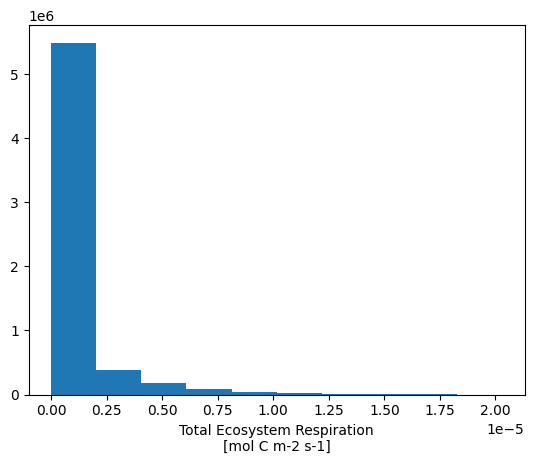

In [27]:
dstest = xr.open_dataset("/home/pietaril/Documents/data/SiB4/sib4-hourly-2018/sib4-hourly-2018-08-05.nc")
dstest.resp_tot.plot()

# Regional hourly averages for summer months

In [3]:

PATHTOSIB = "/home/pietaril/Documents/data/SiB4/"
aoi = [-12, 35, 35, 72]

hourly_means_sib = []
years_sib = []
subdirs = os.listdir(PATHTOSIB)
subdirs.sort()

for subdir in subdirs:
    year = subdir[-4:]
    years_sib.append(year)
    PATH = os.path.join(PATHTOSIB, subdir)
    #only take summer months
    fnames = [os.path.join(PATH, f) for f in os.listdir(PATH) if sib_is_summer(f)]
    fnames.sort()
    ds = xr.open_mfdataset(fnames, engine="h5netcdf")
    subset = select_area(aoi, ds)
    nee = subset.resp_tot - subset.gpp
    hourly_mean_nee = regional_hourly_means(nee)
    # unit conversion from mol/s to g/s
    co2molmass = 44.009
    hourly_mean_nee = hourly_mean_nee*co2molmass
    hourly_mean_nee["year"] = year
    hourly_means_sib.append(hourly_mean_nee.compute())
    ds.close()
    



In [9]:
ds_hourly_means_sib = xr.concat(hourly_means_sib, dim="year")
sib_min = ds_hourly_means_sib.min(dim="year")
sib_max = ds_hourly_means_sib.max(dim="year")
sib_mean = ds_hourly_means_sib.mean(dim="year")

# Compute the same for JSBACH
* Since JSBACH data has some rounding problem with the daily timestamps (i.e. something happened when 1 day divided into 24 hours so that the time between consecutive timestamps isn't constant), I'll just use the corresponding time axis from the SiB4-data

In [5]:
PATHTORAWDATA = "/home/pietaril/Documents/data/JSBACH_CO2/raw_data_example/hourly_NEE_201608.nc"
ds = xr.open_dataset(PATHTORAWDATA)
ds.time.dt.minute[:10]

<xarray.DataArray 'minute' (time: 10)>
array([ 0,  1, 58,  0,  1, 58,  0,  1, 58,  0])
Coordinates:
  * time     (time) datetime64[ns] 2016-08-01 ... 2016-08-01T09:00:00

In [12]:
PATHTOSIB = "/home/pietaril/Documents/data/SiB4/"
aoi = [-12, 35, 35, 72]


subdirs = os.listdir(PATHTOSIB)
subdirs.sort()

hourly_means_jsbach = []
years_jsbach = []
PATHTOJSBACH = "/home/pietaril/Documents/data/JSBACH_CO2/bio_prior_domain_-12_35_35_72/"
fnames = [os.path.join(PATHTOJSBACH, f) for f in os.listdir(PATHTOJSBACH)]
fnames.sort()
for k in range(len(fnames)):
    f = fnames[k]
    yearjsbach = f[-7:-3]
    years_jsbach.append(yearjsbach)
    #the dataset has unit kg/m2/hr
    ds = xr.open_dataset(f)
    ds_summer = ds.isel(time=ds.time.dt.month.isin([5, 6, 7]))
    #unit conversion to g/m2/s 
    nee = ds_summer["emi_bio"]*10/36

    #open the corresponding sibdata to get evenly spaced timeaxis
    subdirsib = subdirs[k]
    
    yearsib = subdirsib[-4:]
    #make sure the year is the same
    assert yearjsbach == yearsib
    PATH = os.path.join(PATHTOSIB, subdirsib)
    #only take summer months
    fnamessib = [os.path.join(PATH, f) for f in os.listdir(PATH) if sib_is_summer(f)]
    fnamessib.sort()
    dssib = xr.open_mfdataset(fnamessib, engine="h5netcdf")
    time2 = dssib["time"]
    #replace jsbach time axis by sib-timeaxis
    nee["time"] = time2
    dssib.close()



    hourly_mean_nee = regional_hourly_means(nee)
    hourly_mean_nee["year"] = yearjsbach
    hourly_means_jsbach.append(hourly_mean_nee)
    ds.close()
    
    

In [13]:
ds_hourly_means_jsbach = xr.concat(hourly_means_jsbach, dim="year")
jsbach_min = ds_hourly_means_jsbach.min(dim="year")
jsbach_max = ds_hourly_means_jsbach.max(dim="year")
jsbach_mean = ds_hourly_means_jsbach.mean(dim="year")

In [14]:
jsbach_mean

<xarray.Dataset>
Dimensions:  (hour: 24)
Coordinates:
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23
Data variables:
    nee      (hour) float64 -3.242e+06 -1.368e+07 ... -7.941e+05 -1.047e+06

In [16]:
ds_hourly_means_jsbach

<xarray.Dataset>
Dimensions:  (hour: 24, year: 7)
Coordinates:
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23
  * year     (year) <U4 '2015' '2016' '2017' '2018' '2019' '2020' '2021'
Data variables:
    nee      (year, hour) float64 -3.821e+13 -1.601e+14 ... -1.462e+13

In [33]:
ds_hourly_means_sib

<xarray.Dataset>
Dimensions:  (hour: 24, year: 7)
Coordinates:
  * hour     (hour) int64 0 1 2 3 4 5 6 7 8 9 ... 14 15 16 17 18 19 20 21 22 23
  * year     (year) <U4 '2015' '2016' '2017' '2018' '2019' '2020' '2021'
Data variables:
    nee      (year, hour) float64 -8.003e+08 -7.675e+08 ... -8.697e+08

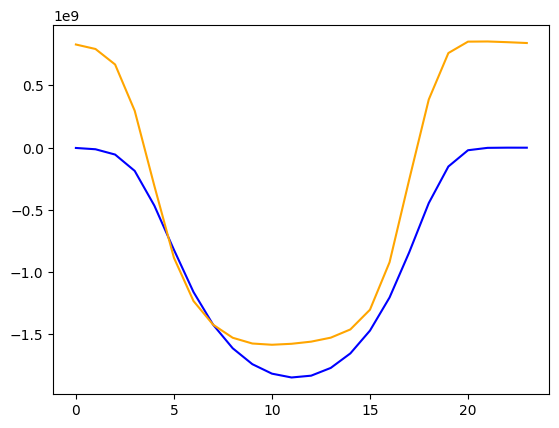

In [15]:
fig, ax = plt.subplots()
ax.plot(jsbach_mean["nee"], color="blue")
ax.plot(sib_mean["nee"], color = "orange")

In [3]:
#convert to g/m2/yr and collect the converted datasets in a list

PATHTOSIB = "/home/pietaril/Documents/data/SiB4/"
aoi = [-12, 35, 35, 72]

ls_yearly_sib = []
ls_tot_sib = []
years_sib = []
subdirs = os.listdir(PATHTOSIB)
subdirs.sort()

for subdir in subdirs[:2]:
    year = subdir[-4:]
    PATH = os.path.join(PATHTOSIB, subdir)
    fnames = [os.path.join(PATH, f) for f in os.listdir(PATH)]
    fnames.sort()
    ds = xr.open_mfdataset(fnames, engine="h5netcdf")
    ds = select_area(aoi, ds)
    nee_g_m2_yr = sib_to_nee_g_m2_yr(ds)
    nee_g_m2_yr["time"] = year
    sib_tot = g_per_m2_per_yr_to_Mt_per_yr(nee_g_m2_yr, "nee")
    ls_yearly_sib.append(nee_g_m2_yr)
    ls_tot_sib.append(sib_tot)
    years_sib.append(year)

    

In [4]:
ds

<xarray.Dataset>
Dimensions:    (time: 8784, latitude: 74, longitude: 94)
Coordinates:
  * longitude  (longitude) float32 -11.75 -11.25 -10.75 ... 33.75 34.25 34.75
  * latitude   (latitude) float32 35.25 35.75 36.25 36.75 ... 70.75 71.25 71.75
  * time       (time) datetime64[ns] 2016-01-01T00:30:00 ... 2016-12-31T23:30...
Data variables:
    gpp        (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    resp_tot   (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    emis_fire  (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    resp_auto  (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    resp_het   (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
Attributes:
    email:        aleya.kaushik@noaa.gov
    url:          https://www.gml.noaa.gov/aftp/user/kaushik/SiB4_priors_for_...
    institution:  CU Boulder CIRES/NOAA Global Monitoring Lab

In [5]:
sib_tot.values

array(920.1930793)

In [14]:
nee_g_m2_yr

<xarray.Dataset>
Dimensions:    (longitude: 94, latitude: 74)
Coordinates:
  * longitude  (longitude) float32 -11.75 -11.25 -10.75 ... 33.75 34.25 34.75
  * latitude   (latitude) float32 35.25 35.75 36.25 36.75 ... 70.75 71.25 71.75
Data variables:
    nee        (latitude, longitude) float64 dask.array<chunksize=(74, 94), meta=np.ndarray>
    time       <U4 '2021'

In [16]:
#open the corresponding JSBACH files

ls_yearly_jsbach = []
ls_tot_jsbach = []
years_jsbach = []
PATHTOJSBACH = "/home/pietaril/Documents/data/JSBACH_CO2/g_m2_yr_grids/"
fnames = [os.path.join(PATHTOJSBACH, f) for f in os.listdir(PATHTOJSBACH)]
fnames.sort()
for f in fnames:
    year = f[-7:-3]
    ds_jsbach = xr.open_dataset(f)
    ds_jsbach = select_area(aoi, ds_jsbach)
    #ds_jsbach = ds_jsbach["emi_bio"]
    jsbach_tot = g_per_m2_per_yr_to_Mt_per_yr(ds_jsbach, "emi_bio")
    ls_yearly_jsbach.append(ds_jsbach)
    ls_tot_jsbach.append(jsbach_tot)
    years_jsbach.append(year)
    

In [20]:
sib_tot[:]

IndexError: too many indices

In [18]:
jsbach_tot

<xarray.DataArray 'emi_bio' (time: 1)>
array([-4238.43481927])
Coordinates:
  * time     (time) datetime64[ns] 2021-07-01

In [17]:
print(years_jsbach)
print(years_sib)

['2015', '2016', '2017', '2018', '2019', '2020', '2021']
['2015', '2016', '2017', '2018', '2019', '2020', '2021']


In [ ]:
fig, ax = plt.subplots(layout="constrained")#, figsize=(9,6))
labels = ["SiB4", "JSBACH"]

for (ind,tot) in enumerate(totals):
    data = tot
    data.plot(x="time", ax=ax, marker='.', markersize=12, markerfacecolor='white', label=labels[ind])


#Shrink current axis by 20%
#box = ax.get_position()
#ax.set_position([box.x0, box.y0, box.width, box.height])

# Put a legend to the right of the current axis
ax.legend()#loc='center left')#, bbox_to_anchor=(0.5, 0.8))
ax.set_ylabel("total CO$_2$ emission [Mt/year]")
ax.set_xlabel("")
fig.suptitle("Europe's total ocean emission (CTE-HR)", fontsize = 18 )
#plt.legend()
plt.draw()
figpath = "/home/pietaril/Documents/plots/CTE/total_emis/"
figname = f"CTE_ocean_yearly_totals_CO2.png"
#plt.savefig(figpath+figname)

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Ao

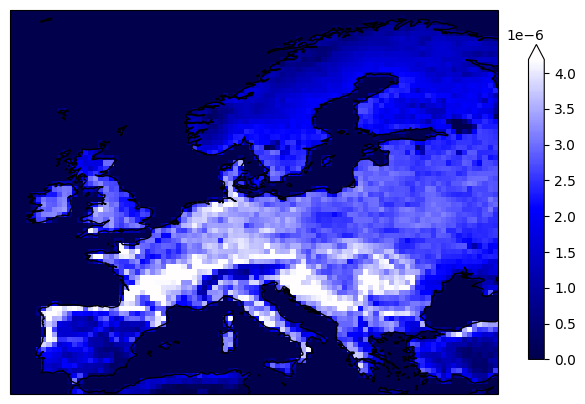

In [17]:


cbar_label = ""#"$g(CO_2)$ $m^{-2}$ $yr^{-1}$"
#variable = "emi_bio"
cbar_shrink = 0.7
cmap = truncate_colormap(mpl.colormaps["seismic"], maxval=0.5)
suptitle=""#"Average biospheric CO$_2$ fluxes $2017-2021$"




fig, ax = plt.subplots(subplot_kw=dict(projection=ccrs.PlateCarree()))

mean_resp.plot.pcolormesh(ax=ax, 
                                      robust=True, cmap=cmap,
                                       cbar_kwargs=dict(label=cbar_label, shrink=cbar_shrink))
ax.coastlines()
ax.set_title(suptitle)
plt.tight_layout()
plt.draw()
figpath = "/home/pietaril/Documents/plots/JSBACH/"
figname = f"JSBACH_scandinavia_mean_CO2_flux_2017_2021.png"
#plt.savefig(figpath+figname)
plt.draw()